### Import needed packages to wrangle data

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import nltk
from nltk.tokenize import RegexpTokenizer
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pandas as pd
import numpy as np

# Clinton vs. Trump Dataset

In [2]:
ClintonTrump = pd.read_csv("C:/Users/deand/Desktop/Courtney/ClintonTrump.csv")
ClintonTrump.head()

,id,handle,text,is_retweet,original_author,time,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,is_quote_status,...,place_type,place_country_code,place_country,place_contained_within,place_attributes,place_bounding_box,source_url,truncated,entities,extended_entities
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,False,NaN,2016-09-28T00:22:34,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Xr...,{'media': [{'display_url': 'pic.twitter.com/Xr...
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",True,timkaine,2016-09-27T23:45:00,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,http://twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/t0...,{'media': [{'display_url': 'pic.twitter.com/t0...
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,True,POTUS,2016-09-27T23:26:40,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [{'id_str': '1536791610', 'n...",NaN
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",False,NaN,2016-09-27T23:08:41,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Q3...,{'media': [{'display_url': 'pic.twitter.com/Q3...
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,False,NaN,2016-09-27T22:30:27,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [], 'symbols': [], 'urls': [...",NaN


### Renaming columns

In [3]:
ClintonTrump.rename(columns={'is_retweet':'retweets', 'handle':'username','text':'tweet','entities':'source'},inplace=True)

In [4]:
ClintonTrump.dtypes

id                           int64
username                    object
tweet                       object
retweets                      bool
original_author             object
time                        object
in_reply_to_screen_name     object
in_reply_to_status_id      float64
in_reply_to_user_id        float64
is_quote_status               bool
lang                        object
retweet_count                int64
favorite_count               int64
longitude                  float64
latitude                   float64
place_id                    object
place_full_name             object
place_name                  object
place_type                  object
place_country_code          object
place_country               object
place_contained_within      object
place_attributes            object
place_bounding_box          object
source_url                  object
truncated                     bool
source                      object
extended_entities           object
dtype: object

In [5]:
ClintonTrump['retweets'] = ClintonTrump['retweets'].astype(str)

### Recoding 'retweets' column

In [6]:
def retweets (series):
    if series == "True":
        return 0
    if series == "False":
        return 1

In [7]:
ClintonTrump['retweetsR'] = ClintonTrump['retweets'].apply(retweets)

In [8]:
ClintonTrump.head()

,id,username,tweet,retweets,original_author,time,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,is_quote_status,...,place_country_code,place_country,place_contained_within,place_attributes,place_bounding_box,source_url,truncated,source,extended_entities,retweetsR
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,False,NaN,2016-09-28T00:22:34,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Xr...,{'media': [{'display_url': 'pic.twitter.com/Xr...,1
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",True,timkaine,2016-09-27T23:45:00,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,http://twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/t0...,{'media': [{'display_url': 'pic.twitter.com/t0...,0
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,True,POTUS,2016-09-27T23:26:40,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [{'id_str': '1536791610', 'n...",NaN,0
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",False,NaN,2016-09-27T23:08:41,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Q3...,{'media': [{'display_url': 'pic.twitter.com/Q3...,1
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,False,NaN,2016-09-27T22:30:27,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [], 'symbols': [], 'urls': [...",NaN,1


### Subsetting data to keep only the necessary columns

In [9]:
ClintonTrump1 = ClintonTrump[['id','username','tweet','time','source','retweetsR','retweet_count']]

In [10]:
ClintonTrump1.head()

,id,username,tweet,time,source,retweetsR,retweet_count
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,2016-09-28T00:22:34,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",2016-09-27T23:45:00,{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,2016-09-27T23:26:40,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",2016-09-27T23:08:41,{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,2016-09-27T22:30:27,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859


### Splitting 'time' column

In [11]:
ClintonTrump2 = ClintonTrump1['time'].str.split('-',expand=True).rename(columns = lambda x: "date"+str(x+1))

In [12]:
ClintonTrump2.head()

,date1,date2,date3
0,2016,09,28T00:22:34
1,2016,09,27T23:45:00
2,2016,09,27T23:26:40
3,2016,09,27T23:08:41
4,2016,09,27T22:30:27


In [13]:
dateTime = ClintonTrump2['date3'].str.split('T',expand=True).rename(columns = lambda x: "time"+str(x+1))
dateTime.head()

,time1,time2
0,28,00:22:34
1,27,23:45:00
2,27,23:26:40
3,27,23:08:41
4,27,22:30:27


In [14]:
ClintonTrump3 = ClintonTrump2[['date1','date2']]

### Adding time and date columns back to original dataframe

In [15]:
ClintonTrump4 = pd.concat([ClintonTrump1,ClintonTrump3,dateTime],axis=1)

In [16]:
ClintonTrump4.head()

,id,username,tweet,time,source,retweetsR,retweet_count,date1,date2,time1,time2
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,2016-09-28T00:22:34,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218,2016,09,28,00:22:34
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",2016-09-27T23:45:00,{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445,2016,09,27,23:45:00
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,2016-09-27T23:26:40,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834,2016,09,27,23:26:40
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",2016-09-27T23:08:41,{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916,2016,09,27,23:08:41
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,2016-09-27T22:30:27,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859,2016,09,27,22:30:27


### Renaming date and time columns

In [17]:
ClintonTrump5 = ClintonTrump4.rename(columns={'date1':'year','date2':'month','time1':'date','time2':'Time'})

In [18]:
ClintonTrump5 = ClintonTrump5.drop(['time'], axis=1)

### Final version of Clinton vs. Trump dataset

In [19]:
ClintonTrump5.head()

,id,username,tweet,source,retweetsR,retweet_count,year,month,date,Time
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218,2016,09,28,00:22:34
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445,2016,09,27,23:45:00
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834,2016,09,27,23:26:40
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916,2016,09,27,23:08:41
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859,2016,09,27,22:30:27


# Biden Dataset

In [20]:
Biden = pd.read_csv("C:/Users/deand/Desktop/Courtney/Biden.csv")
Biden.head()

,id,username,timestamp,link,tweet,retweets,likes
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,6551,23058
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",1863,6348
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,14189,56220
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2158,11484
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,38212,164059


### Splitting 'timestamp' column

In [21]:
Biden1 = Biden['timestamp'].str.split('-',expand=True).rename(columns = lambda x: "date"+str(x+1))

In [22]:
Biden1.tail()

,date1,date2,date3
5233,2012,04,09 16:05
5234,2012,04,09 13:25
5235,2012,04,09 13:11
5236,2012,04,09 09:43
5237,2012,04,09 09:42


In [23]:
Biden2 = Biden1['date3'].str.split(' ',expand=True).rename(columns = lambda x: "time"+str(x+1))

In [24]:
Biden2.head()

,time1,time2
0,31,23:59
1,31,23:30
2,31,23:02
3,31,22:23
4,31,18:26


In [25]:
Biden3 = Biden1[['date1','date2']]

### Adding time and date columns back to original dataframe

In [26]:
Biden4 = pd.concat([Biden,Biden3,Biden2],axis=1)

In [27]:
Biden4.head()

,id,username,timestamp,link,tweet,retweets,likes,date1,date2,time1,time2
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,6551,23058,2020,08,31,23:59
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",1863,6348,2020,08,31,23:30
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,14189,56220,2020,08,31,23:02
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2158,11484,2020,08,31,22:23
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,38212,164059,2020,08,31,18:26


### Renaming columns and dropping unneeded columns

In [28]:
Biden5 = Biden4.rename(columns={'date1':'year','date2':'month','time1':'date','time2':'Time','link':'source'})

In [29]:
Biden5 = Biden5.drop(columns=['timestamp','likes'])

### Duplicating 'retweets' column data into new column

In [30]:
Biden5['retweet_count'] = Biden5['retweets']

### Recoding 'retweets' column

In [31]:
def Retweets (series):
    if series > 0:
        return 0
Biden5['retweetsR'] = Biden5['retweets'].apply(Retweets)

In [32]:
Biden5 = Biden5.drop(columns=['retweets'])

### Final version of Biden dataset

In [33]:
Biden5.head()

,id,username,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0


# Appending the dataframes

In [34]:
AllTweets = pd.concat([Biden5, ClintonTrump5], ignore_index=True)

In [35]:
AllTweets.head()

,id,username,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0


# Final dataframes

In [36]:
AllTweets

,id,username,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0
...,...,...,...,...,...,...,...,...,...,...
11677,684219579548041218,realDonaldTrump,"{'user_mentions': [{'id_str': '26122621', 'nam...","""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,01,05,03:47:14,1110,1
11678,684218836569206784,realDonaldTrump,"{'user_mentions': [{'id_str': '3477455725', 'n...","""@marybnall01: @realDonaldTrump watched lowell...",2016,01,05,03:44:17,855,1
11679,684218305100525569,realDonaldTrump,{'media': [{'display_url': 'pic.twitter.com/JB...,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,01,05,03:42:10,2315,1
11680,684217554861199360,realDonaldTrump,"{'user_mentions': [{'id_str': '42568997', 'nam...","""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,01,05,03:39:11,1054,1


### Dropping Colomns I don't need in each Dataset

In [37]:
FinalAllTweets = AllTweets.drop(columns=['source', 'month','date', 'Time' ])

In [38]:
FinalAllTweets

,id,username,tweet,year,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,6551,0
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,1863,0
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,14189,0
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,2158,0
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,38212,0
...,...,...,...,...,...,...
11677,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,1110,1
11678,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",2016,855,1
11679,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,2315,1
11680,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,1054,1


In [39]:
Biden5

,id,username,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0
...,...,...,...,...,...,...,...,...,...,...
5233,189383473717460992,JoeBiden,https://twitter.com/JoeBiden/status/1893834737...,I’m for the Buffett Rule because it just makes...,2012,04,09,16:05,473,0
5234,189343279140184065,JoeBiden,https://twitter.com/JoeBiden/status/1893432791...,"In NH on 4/12, the Vice President will give hi...",2012,04,09,13:25,53,0
5235,189339650610036736,JoeBiden,https://twitter.com/JoeBiden/status/1893396506...,News for you this morning: VP Biden will speak...,2012,04,09,13:11,54,0
5236,189287350034104320,JoeBiden,https://twitter.com/JoeBiden/status/1892873500...,Campaign staff will run this account to keep y...,2012,04,09,09:43,71,0


In [40]:
FinalBiden5 = Biden5.drop(columns=['source', 'month','date', 'Time'])

In [41]:
FinalBiden5

,id,username,tweet,year,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,6551,0
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,1863,0
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,14189,0
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,2158,0
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,38212,0
...,...,...,...,...,...,...
5233,189383473717460992,JoeBiden,I’m for the Buffett Rule because it just makes...,2012,473,0
5234,189343279140184065,JoeBiden,"In NH on 4/12, the Vice President will give hi...",2012,53,0
5235,189339650610036736,JoeBiden,News for you this morning: VP Biden will speak...,2012,54,0
5236,189287350034104320,JoeBiden,Campaign staff will run this account to keep y...,2012,71,0


In [42]:
ClintonTrump5

,id,username,tweet,source,retweetsR,retweet_count,year,month,date,Time
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218,2016,09,28,00:22:34
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445,2016,09,27,23:45:00
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834,2016,09,27,23:26:40
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916,2016,09,27,23:08:41
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859,2016,09,27,22:30:27
...,...,...,...,...,...,...,...,...,...,...
6439,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...","{'user_mentions': [{'id_str': '26122621', 'nam...",1,1110,2016,01,05,03:47:14
6440,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...","{'user_mentions': [{'id_str': '3477455725', 'n...",1,855,2016,01,05,03:44:17
6441,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",{'media': [{'display_url': 'pic.twitter.com/JB...,1,2315,2016,01,05,03:42:10
6442,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...","{'user_mentions': [{'id_str': '42568997', 'nam...",1,1054,2016,01,05,03:39:11


In [43]:
FinalClintonTrump5 = ClintonTrump5.drop(columns=['month','date', 'Time', 'source'])

In [44]:
FinalClintonTrump5

,id,username,tweet,retweetsR,retweet_count,year
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,1,218,2016
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",0,2445,2016
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,0,7834,2016
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",1,916,2016
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,1,859,2016
...,...,...,...,...,...,...
6439,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",1,1110,2016
6440,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",1,855,2016
6441,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",1,2315,2016
6442,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",1,1054,2016


# --------- NLP Sentiment Analysis ----------

### import packages 
### Terminal / Anaconda Navigator: conda install -c conda-forge textblob

In [45]:
from textblob import TextBlob
from bs4 import BeautifulSoup
import re
import nltk
import nltk.data
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.corpus import stopwords
lemmatizer = WordNetLemmatizer()

### Remove HTML, Emails, Stop Words, Weblinks, Whitespace, Numbers, Special Characters, NAN, and Lowercase Text

In [46]:
 def preprocess(sentence):
    sentence=str(sentence)
    sentence = sentence.lower()
    sentence=sentence.replace('{html}',"") 
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, '', sentence)
    rem_url=re.sub(r'http\S+', '',cleantext)
    rem_num = re.sub('[0-9]+', '', rem_url)
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(rem_num)  
    filtered_words = [w for w in tokens if len(w) > 2 if not w in stopwords.words('english')]
    stem_words=[stemmer.stem(w) for w in filtered_words]
    lemma_words=[lemmatizer.lemmatize(w) for w in stem_words]
    return " ".join(filtered_words)
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import TweetTokenizer
stemmer = PorterStemmer() 

### Adding cleanText to all datasets

In [47]:
FinalAllTweets['cleanText']=FinalAllTweets['tweet'].map(lambda s:preprocess(s)) 

In [48]:
FinalBiden5['cleanText']=FinalBiden5['tweet'].map(lambda s:preprocess(s))

In [49]:
FinalClintonTrump5['cleanText']=FinalClintonTrump5['tweet'].map(lambda s:preprocess(s))

In [50]:
FinalAllTweets.head()

,id,username,tweet,year,retweet_count,retweetsR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,6551,0,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,1863,0,folks hours away first end month fundraising d...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,14189,0,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,2158,0,anyone met amari tell charismatic young man po...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,38212,0,cops died covid year killed patrol nearly one ...


In [51]:
FinalBiden5.head()

,id,username,tweet,year,retweet_count,retweetsR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,6551,0,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,1863,0,folks hours away first end month fundraising d...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,14189,0,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,2158,0,anyone met amari tell charismatic young man po...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,38212,0,cops died covid year killed patrol nearly one ...


In [52]:
FinalClintonTrump5.head()

,id,username,tweet,retweetsR,retweet_count,year,cleanText
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,1,218,2016,question election put plans action make life b...
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",0,2445,2016,last night donald trump said paying taxes smar...
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,0,7834,2016,proud hillaryclinton vision command last night...
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",1,916,2016,stand together nothing make sure ready vote
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,1,859,2016,candidates asked confront racial injustice one...


### Removing Short Words from cleanText

In [53]:
FinalAllTweets['cleanText'] = FinalAllTweets['cleanText'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

FinalAllTweets.head(10)

,id,username,tweet,year,retweet_count,retweetsR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,6551,0,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,1863,0,folks hours away first month fundraising deadl...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,14189,0,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,2158,0,anyone amari tell charismatic young poised gre...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,38212,0,cops died covid year killed patrol nearly smal...
5,1300496925129666561,JoeBiden,"Mr. President, it’s high time you condemn viol...",2020,11625,0,president high time condemn violence form
6,1300495317041729536,JoeBiden,Donald Trump keeps telling us if he was presid...,2020,59385,0,donald trump keeps telling president feel safe...
7,1300494058746458116,JoeBiden,Trump and Pence are running on this: “You won’...,2020,33740,0,trump pence running safe biden america proof v...
8,1300492800161583104,JoeBiden,The simple truth is Donald Trump failed to pro...,2020,51930,0,simple truth donald trump failed protect ameri...
9,1300491542000361473,JoeBiden,"I want a safe America — safe from COVID, safe ...",2020,17708,0,want safe america safe covid safe crime lootin...


In [54]:
FinalBiden5['cleanText'] = FinalBiden5['cleanText'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

FinalBiden5.head(10)

,id,username,tweet,year,retweet_count,retweetsR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,6551,0,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,1863,0,folks hours away first month fundraising deadl...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,14189,0,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,2158,0,anyone amari tell charismatic young poised gre...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,38212,0,cops died covid year killed patrol nearly smal...
5,1300496925129666561,JoeBiden,"Mr. President, it’s high time you condemn viol...",2020,11625,0,president high time condemn violence form
6,1300495317041729536,JoeBiden,Donald Trump keeps telling us if he was presid...,2020,59385,0,donald trump keeps telling president feel safe...
7,1300494058746458116,JoeBiden,Trump and Pence are running on this: “You won’...,2020,33740,0,trump pence running safe biden america proof v...
8,1300492800161583104,JoeBiden,The simple truth is Donald Trump failed to pro...,2020,51930,0,simple truth donald trump failed protect ameri...
9,1300491542000361473,JoeBiden,"I want a safe America — safe from COVID, safe ...",2020,17708,0,want safe america safe covid safe crime lootin...


In [55]:
FinalClintonTrump5['cleanText'] = FinalClintonTrump5['cleanText'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

FinalClintonTrump5.head(10)

,id,username,tweet,retweetsR,retweet_count,year,cleanText
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,1,218,2016,question election plans action make life better
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",0,2445,2016,last night donald trump said paying taxes smar...
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,0,7834,2016,proud hillaryclinton vision command last night...
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",1,916,2016,stand together nothing make sure ready vote
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,1,859,2016,candidates asked confront racial injustice rea...
5,780893126605037568,realDonaldTrump,Join me for a 3pm rally - tomorrow at the Mid-...,1,2181,2016,join rally tomorrow america center council blu...
6,780883582051123200,HillaryClinton,This election is too important to sit out. Go ...,1,1303,2016,election important make sure registered nation...
7,780881075891531776,HillaryClinton,When Donald Trump goes low...register to vote:...,1,1833,2016,donald trump goes register vote
8,780876760086880256,realDonaldTrump,"Once again, we will have a government of, by a...",1,4132,2016,government people join movement today
9,780874710049550336,HillaryClinton,3) Has Trump offered a single proposal to redu...,0,1087,2016,trump offered single proposal reduce friction ...


### Tokenize Clean Tweets

In [56]:
tokenizedAllTweets = FinalAllTweets['cleanText'].apply(lambda x: x.split())
tokenizedAllTweets.head()

0    [donald, trump, looks, violence, sees, politic...
1    [folks, hours, away, first, month, fundraising...
2    [truth, donald, trump, stop, violence, years, ...
3    [anyone, amari, tell, charismatic, young, pois...
4    [cops, died, covid, year, killed, patrol, near...
Name: cleanText, dtype: object

In [57]:
tokenizedTweetBiden = FinalBiden5['cleanText'].apply(lambda x: x.split())
tokenizedTweetBiden.head()

0    [donald, trump, looks, violence, sees, politic...
1    [folks, hours, away, first, month, fundraising...
2    [truth, donald, trump, stop, violence, years, ...
3    [anyone, amari, tell, charismatic, young, pois...
4    [cops, died, covid, year, killed, patrol, near...
Name: cleanText, dtype: object

In [58]:
tokenizedTweetClintTrump = FinalClintonTrump5['cleanText'].apply(lambda x: x.split())
tokenizedTweetClintTrump.head()

0    [question, election, plans, action, make, life...
1    [last, night, donald, trump, said, paying, tax...
2    [proud, hillaryclinton, vision, command, last,...
3    [stand, together, nothing, make, sure, ready, ...
4    [candidates, asked, confront, racial, injustic...
Name: cleanText, dtype: object

### Steeming the veggies better known as the cleanText :)

In [59]:
tokenizedAllTweets = tokenizedAllTweets.apply(lambda x: [stemmer.stem(i) for i in x])

tokenizedAllTweets.head()

0    [donald, trump, look, violenc, see, polit, lif...
1    [folk, hour, away, first, month, fundrais, dea...
2    [truth, donald, trump, stop, violenc, year, fo...
3    [anyon, amari, tell, charismat, young, pois, g...
4    [cop, die, covid, year, kill, patrol, nearli, ...
Name: cleanText, dtype: object

In [60]:
tokenizedTweetBiden = tokenizedTweetBiden.apply(lambda x: [stemmer.stem(i) for i in x])

tokenizedTweetBiden.head()

0    [donald, trump, look, violenc, see, polit, lif...
1    [folk, hour, away, first, month, fundrais, dea...
2    [truth, donald, trump, stop, violenc, year, fo...
3    [anyon, amari, tell, charismat, young, pois, g...
4    [cop, die, covid, year, kill, patrol, nearli, ...
Name: cleanText, dtype: object

In [61]:
tokenizedTweetClintTrump = tokenizedTweetClintTrump.apply(lambda x: [stemmer.stem(i) for i in x])

tokenizedTweetClintTrump.head()

0    [question, elect, plan, action, make, life, be...
1    [last, night, donald, trump, said, pay, tax, s...
2    [proud, hillaryclinton, vision, command, last,...
3       [stand, togeth, noth, make, sure, readi, vote]
4    [candid, ask, confront, racial, injustic, real...
Name: cleanText, dtype: object

## Bar Graphing Words

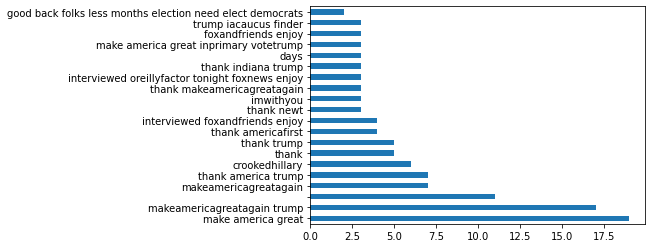

In [62]:
FinalAllTweets['cleanText'].value_counts()[:20].plot(kind='barh')

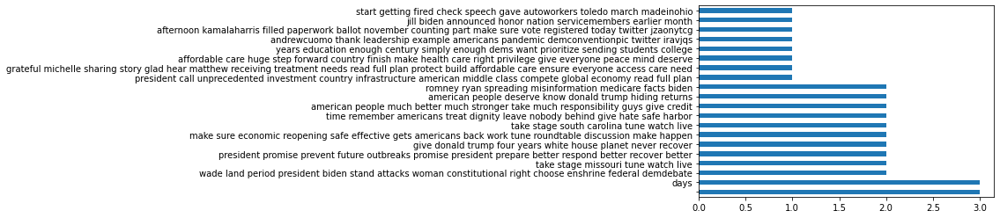

In [63]:
FinalBiden5['cleanText'].value_counts()[:20].plot(kind='barh')

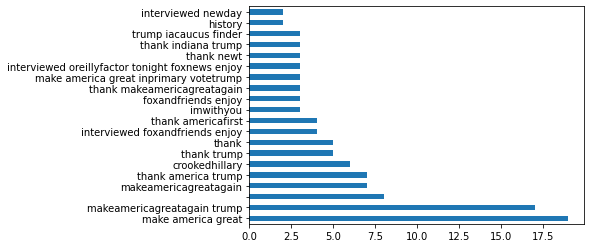

In [64]:
FinalClintonTrump5['cleanText'].value_counts()[:20].plot(kind='barh')

# Sentiment

In [65]:
pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

### All Tweets Combined

In [66]:
FinalAllTweets['polarity'] = FinalAllTweets['tweet'].apply(pol)
FinalAllTweets['subjectivity'] = FinalAllTweets['tweet'].apply(sub)

In [67]:
FinalAllTweets.tail()

,id,username,tweet,year,retweet_count,retweetsR,cleanText,polarity,subjectivity
11677,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,1110,1,lilredfrmkokomo realdonaldtrump facebook group...,1.000000,0.750000
11678,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",2016,855,1,marybnall realdonaldtrump watched lowell mass ...,0.933333,0.833333
11679,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,2315,1,ghosthunter_lol iowa endorsement realdonaldtru...,0.000000,1.000000
11680,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,1054,1,iloveidevices edwinro happyjack foxnews krauth...,0.000000,0.000000
11681,684216973815844866,realDonaldTrump,"""@SalRiccobono: @realDonaldTrump @troyconway D...",2016,748,1,salriccobono realdonaldtrump troyconway donald...,0.266667,0.283333


In [68]:
FinalBiden5['polarity'] = FinalBiden5['tweet'].apply(pol)
FinalBiden5['subjectivity'] = FinalBiden5['tweet'].apply(sub)

In [69]:
FinalBiden5.tail()

,id,username,tweet,year,retweet_count,retweetsR,cleanText,polarity,subjectivity
5233,189383473717460992,JoeBiden,I’m for the Buffett Rule because it just makes...,2012,473,0,buffett rule makes sense like president says c...,0.000,0.000
5234,189343279140184065,JoeBiden,"In NH on 4/12, the Vice President will give hi...",2012,53,0,vice president give take millionaires lower ra...,0.000,0.000
5235,189339650610036736,JoeBiden,News for you this morning: VP Biden will speak...,2012,54,0,news morning biden speak exeter fairness presi...,0.000,0.000
5236,189287350034104320,JoeBiden,Campaign staff will run this account to keep y...,2012,71,0,campaign staff account keep date occasional tw...,0.000,0.125
5237,189287227321356289,JoeBiden,We're excited to announce that @ JoeBiden is b...,2012,82,0,excited announce joebiden rebooted campaign se...,0.375,0.750


In [70]:
FinalClintonTrump5['polarity'] = FinalClintonTrump5['tweet'].apply(pol)
FinalClintonTrump5['subjectivity'] = FinalClintonTrump5['tweet'].apply(sub)

In [71]:
FinalClintonTrump5.tail()

,id,username,tweet,retweetsR,retweet_count,year,cleanText,polarity,subjectivity
6439,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",1,1110,2016,lilredfrmkokomo realdonaldtrump facebook group...,1.000000,0.750000
6440,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",1,855,2016,marybnall realdonaldtrump watched lowell mass ...,0.933333,0.833333
6441,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",1,2315,2016,ghosthunter_lol iowa endorsement realdonaldtru...,0.000000,1.000000
6442,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",1,1054,2016,iloveidevices edwinro happyjack foxnews krauth...,0.000000,0.000000
6443,684216973815844866,realDonaldTrump,"""@SalRiccobono: @realDonaldTrump @troyconway D...",1,748,2016,salriccobono realdonaldtrump troyconway donald...,0.266667,0.283333


In [72]:
FinalAllTweets.describe()

,id,retweet_count,retweetsR,polarity,subjectivity
count,1.168200e+04,11682.000000,11682.000000,11682.000000,11682.000000
mean,8.702333e+17,4618.046054,0.489813,0.126911,0.368507
std,2.830693e+17,9798.824881,0.499918,0.297972,0.299820
min,1.892872e+17,1.000000,0.000000,-1.000000,0.000000
25%,7.288195e+17,819.250000,0.000000,0.000000,0.000000
50%,7.631107e+17,2248.500000,0.000000,0.010764,0.383631
75%,1.175032e+18,5354.750000,1.000000,0.275000,0.571354
max,1.300584e+18,490180.000000,1.000000,1.000000,1.000000


In [73]:
FinalAllTweets.dtypes

id                 int64
username          object
tweet             object
year              object
retweet_count      int64
retweetsR          int64
cleanText         object
polarity         float64
subjectivity     float64
dtype: object

## Polarity V Subjectivity

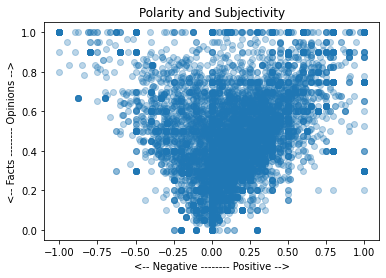

In [83]:
x = FinalAllTweets.polarity
y = FinalAllTweets.subjectivity
fig, ax = plt.subplots()


ax.scatter(x, y, alpha=0.3, cmap = 'viridis')
ax.set_title('Polarity and Subjectivity')
ax.set_xlabel('<-- Negative -------- Positive -->')
ax.set_ylabel('<-- Facts -------- Opinions -->')



plt.show()

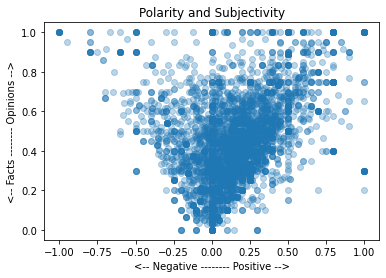

In [84]:
x = FinalBiden5.polarity
y = FinalBiden5.subjectivity
fig, ax = plt.subplots()


ax.scatter(x, y, alpha=0.3, cmap = 'viridis')
ax.set_title('Polarity and Subjectivity')
ax.set_xlabel('<-- Negative -------- Positive -->')
ax.set_ylabel('<-- Facts -------- Opinions -->')



plt.show()

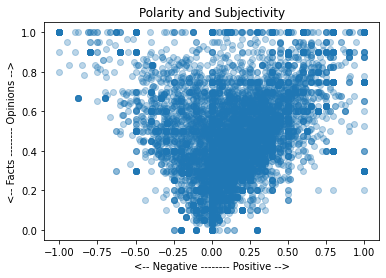

In [85]:
x = FinalAllTweets.polarity
y = FinalAllTweets.subjectivity
fig, ax = plt.subplots()


ax.scatter(x, y, alpha=0.3, cmap = 'viridis')
ax.set_title('Polarity and Subjectivity')
ax.set_xlabel('<-- Negative -------- Positive -->')
ax.set_ylabel('<-- Facts -------- Opinions -->')



plt.show()

### Making a Word Cloud for Retweets (with Twitter symbol)

#### Import Packages 

In [77]:
from wordcloud import WordCloud,ImageColorGenerator
from PIL import Image
import urllib
import requests

In [107]:
allRetweets = ' '.join(text for text in FinalAllTweets['cleanText'][FinalAllTweets['retweetsR']==1])

#### combinig the image with the dataset

In [108]:
Mask = np.array(Image.open(requests.get('http://clipart-library.com/image_gallery2/Twitter-PNG-Image.png', stream=True).raw))

#### We use the ImageColorGenerator library from Wordcloud 
#### Here we take the color of the image and impose it over our wordcloud

In [109]:
image_colors = ImageColorGenerator(Mask)

#### Now we use the WordCloud function from the wordcloud library 

In [110]:
wc = WordCloud(background_color='black', height=1500, width=4000,mask=Mask).generate(allRetweets)

## Plotting Word Cloud (wish me luck!)

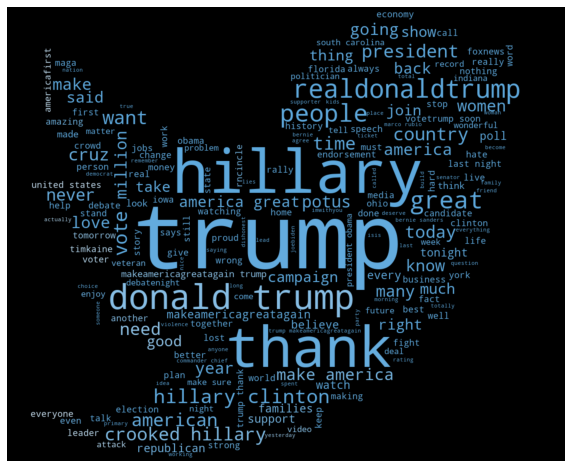

In [112]:
plt.figure(figsize=(10,20))

plt.imshow(wc.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

In [113]:
allRetweets1 = ' '.join(text for text in FinalAllTweets['cleanText'][FinalAllTweets['retweetsR']==0])

In [114]:
wc1 = WordCloud(background_color='black', height=1500, width=4000,mask=Mask).generate(allRetweets1)


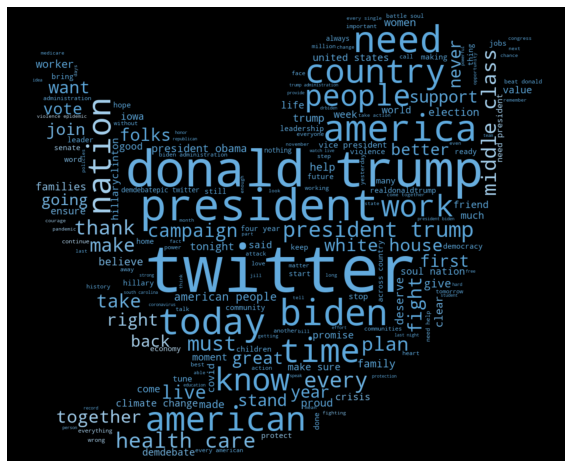

In [115]:
plt.figure(figsize=(10,20))

plt.imshow(wc1.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

In [116]:
allRetweetsClintTrump = ' '.join(text for text in FinalClintonTrump5['cleanText'][FinalClintonTrump5['retweetsR']==1])

In [117]:
wcClintTrump = WordCloud(background_color='black', height=1500, width=4000,mask=Mask).generate(allRetweetsClintTrump)


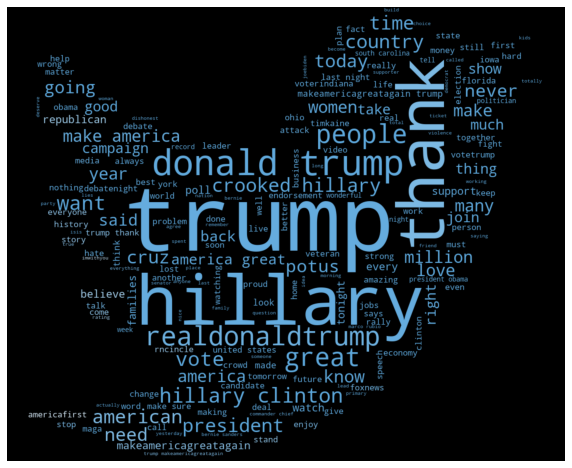

In [118]:
plt.figure(figsize=(10,20))

plt.imshow(wcClintTrump.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

In [119]:
allRetweetsClintTrump1 = ' '.join(text for text in FinalClintonTrump5['cleanText'][FinalClintonTrump5['retweetsR']==0])

In [120]:
wcClintTrump1 = WordCloud(background_color='black', height=1500, width=4000,mask=Mask).generate(allRetweetsClintTrump1)


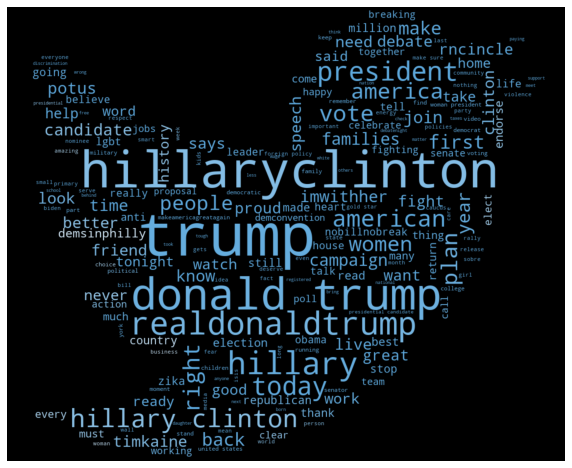

In [121]:
plt.figure(figsize=(10,20))

plt.imshow(wcClintTrump1.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

In [122]:
allRetweetsBiden = ' '.join(text for text in FinalBiden5['cleanText'][FinalBiden5['retweetsR']==0])

In [123]:
wcBiden = WordCloud(background_color='black', height=1500, width=4000,mask=Mask).generate(allRetweetsBiden)


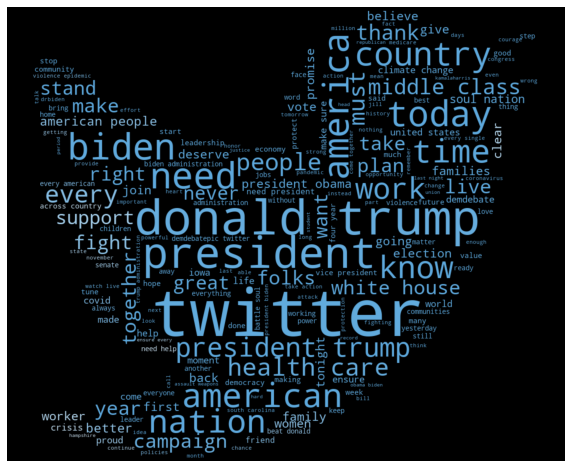

In [124]:
plt.figure(figsize=(10,20))

plt.imshow(wcBiden.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

### extract pos and neg hashtags from  combined tweets 

In [125]:
def Hashtags_Extract(x):
    hashtags=[]
    
  
    for i in x:
        ht = re.findall(r'#(\w+)',i)
        hashtags.append(ht)
    
    return hashtags

In [126]:
positiveAllTweets = Hashtags_Extract(FinalAllTweets['tweet'][FinalAllTweets['retweetsR']==0])

positiveAllTweets

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],


In [127]:
positiveUnnestAll = sum(positiveAllTweets,[])

positiveUnnestAll

['click',
 'tracking',
 'click',
 '2',
 'VoterRegistrationDay',
 'MakeAmericaGreatAgain',
 'Debates2016',
 'NationalVoterRegistrationDay',
 'iRegistered',
 'NationalVoterRegistrationDay',
 'debatenight',
 'debatenight',
 'ImWithHer',
 'debatenight',
 'debate',
 'Debates2016',
 'debate',
 'DebateNight',
 'Debate',
 'MAGA',
 'Debates2016',
 'debate',
 'debate',
 'Debates2016',
 'Polls',
 'slipping',
 'Debates2016',
 'DebateNight',
 'DeclareYourAmbition',
 'ADA',
 'imwithher',
 'CripTheVote',
 'UNGA',
 'polls',
 'HispanicHeritageMonth',
 'HispanicHeritageMonth',
 'LibrarianOfCongress',
 'WeTrumpHate',
 'election2016',
 'MakeAmericaGreatAgain',
 'MAGA',
 'TrumpTrain',
 'NBCNewsForum',
 'NBCNewsForum',
 'NBCNewsForum',
 'NBCNewsForum',
 'NBCNewsForum',
 'TrumpPence16',
 'TrumpinEverett',
 'RIP',
 'JuanGabriel',
 'DivoDeJuarez',
 'GoodTrouble',
 'StrongerTogether',
 'StrongerTogether',
 'WomensEqualityDay',
 'NPS100',
 'NPS100',
 'ImWithHer',
 'Diwali',
 'LAflood',
 'smallbiz',
 'WHD',
 'Ros

In [128]:
negativeAllTweet = Hashtags_Extract(FinalAllTweets['tweet'][FinalAllTweets['retweetsR']==1])

negativeAllTweet

[[],
 [],
 [],
 [],
 ['NationalVoterRegistrationDay'],
 [],
 [],
 [],
 ['MAGA'],
 [],
 ['ImWithYou'],
 ['MAGA'],
 [],
 ['NationalVoterRegistrationDay'],
 ['LoveTrumpsHate'],
 ['StrongerTogether'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['NationalVoterRegistrationDay'],
 ['NationalVoterRegistrationDay'],
 [],
 ['MAGA'],
 ['SheWon'],
 [],
 ['SheWon'],
 ['AmericaFirst', 'MAGA', 'ImWithYou'],
 ['NationalVoterRegistrationDay'],
 [],
 [],
 ['SheWon'],
 [],
 ['SheWon'],
 ['TrumpWon', 'MAGA'],
 [],
 [],
 [],
 ['1', 'TrumpWon'],
 [],
 [],
 [],
 ['SheWon'],
 [],
 [],
 ['DebateNight'],
 ['MAGA'],
 ['DebateNight', 'AmericaFirst', 'ImWithYou'],
 ['DebateNight', 'AmericaFirst', 'MAGA'],
 [],
 [],
 ['DebateNight'],
 ['AmericaFirst', 'Debates2016'],
 ['AmericaFirst'],
 ['Debates2016', 'MAGA'],
 ['DebateNight'],
 ['DebateNight'],
 [],
 ['debatenight'],
 ['debatenight'],
 [],
 ['DebateNight'],
 ['Benghazi', 'Debates2016', 'debatenight'],
 ['debatenight'],
 ['debatenight'],
 ['ISIS', 'DebateNight'],
 [

In [129]:
negativeUnnestAll = sum(negativeAllTweet,[])
negativeUnnestAll

['NationalVoterRegistrationDay',
 'MAGA',
 'ImWithYou',
 'MAGA',
 'NationalVoterRegistrationDay',
 'LoveTrumpsHate',
 'StrongerTogether',
 'NationalVoterRegistrationDay',
 'NationalVoterRegistrationDay',
 'MAGA',
 'SheWon',
 'SheWon',
 'AmericaFirst',
 'MAGA',
 'ImWithYou',
 'NationalVoterRegistrationDay',
 'SheWon',
 'SheWon',
 'TrumpWon',
 'MAGA',
 '1',
 'TrumpWon',
 'SheWon',
 'DebateNight',
 'MAGA',
 'DebateNight',
 'AmericaFirst',
 'ImWithYou',
 'DebateNight',
 'AmericaFirst',
 'MAGA',
 'DebateNight',
 'AmericaFirst',
 'Debates2016',
 'AmericaFirst',
 'Debates2016',
 'MAGA',
 'DebateNight',
 'DebateNight',
 'debatenight',
 'debatenight',
 'DebateNight',
 'Benghazi',
 'Debates2016',
 'debatenight',
 'debatenight',
 'debatenight',
 'ISIS',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'Debates2016',
 'MAGA',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'DebateNight',
 'debatenight'

### counting frequency of pos hashtags then graphing

In [130]:
positiveFreqAll = nltk.FreqDist(positiveUnnestAll)

positiveFreqAll

FreqDist({'ImWithHer': 17, 'RNCinCLE': 12, 'DemsInPhilly': 11, 'MakeAmericaGreatAgain': 10, 'NoBillNoBreak': 9, 'Trump2016': 8, 'TrumpTrain': 6, 'DemConvention': 6, 'Debates2016': 5, 'NBCNewsForum': 5, ...})

In [131]:
positiveDF = pd.DataFrame({'Hashtags':list(positiveFreqAll.keys()),'Count':list(positiveFreqAll.values())})

positiveDF.head(10)

,Hashtags,Count
0,click,2
1,tracking,1
2,2,1
3,VoterRegistrationDay,1
4,MakeAmericaGreatAgain,10
5,Debates2016,5
6,NationalVoterRegistrationDay,2
7,iRegistered,1
8,debatenight,3
9,ImWithHer,17


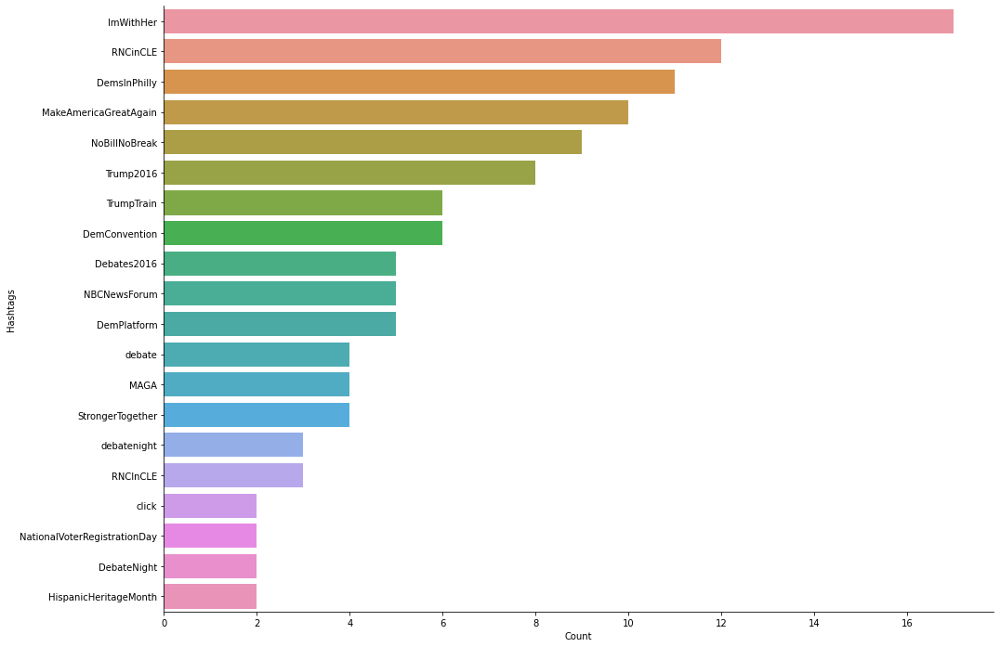

In [132]:
positivePlotAll = positiveDF.nlargest(20,columns='Count')

sns.barplot(data=positivePlotAll,y='Hashtags',x='Count')
sns.despine()

### now, doing the same for negative

In [133]:
negativeFreqAll = nltk.FreqDist(negativeUnnestAll)

negativeFreqAll

FreqDist({'Trump2016': 336, 'MakeAmericaGreatAgain': 240, 'VoteTrump': 67, 'AmericaFirst': 66, 'MAGA': 56, 'ImWithYou': 55, 'RNCinCLE': 51, 'DemsInPhilly': 40, 'DebateNight': 32, 'TrumpTrain': 30, ...})

In [134]:
negativeDF = pd.DataFrame({'Hashtags':list(negativeFreqAll.keys()),'Count':list(negativeFreqAll.values())})

negativeDF.head(10)

,Hashtags,Count
0,NationalVoterRegistrationDay,5
1,MAGA,56
2,ImWithYou,55
3,LoveTrumpsHate,5
4,StrongerTogether,3
5,SheWon,5
6,AmericaFirst,66
7,TrumpWon,2
8,1,5
9,DebateNight,32


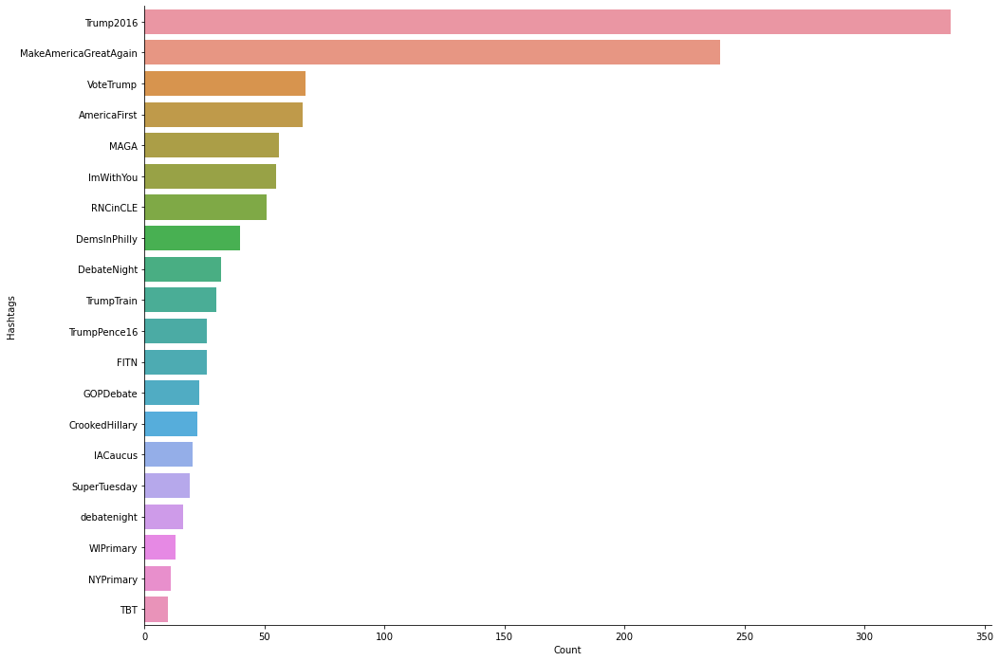

In [135]:
negativePlotAll = negativeDF.nlargest(20,columns='Count')

sns.barplot(data=negativePlotAll,y='Hashtags',x='Count')
sns.despine()

## Hovering Scatterplot

#### import packages 

In [136]:
import plotly
import plotly.express as px

In [137]:
df = px.data.gapminder()
fig = px.scatter(FinalAllTweets, x="polarity", y="subjectivity", size="retweet_count", color="username",
           hover_name="cleanText", log_x=True, size_max=80)
fig.show()

In [138]:
df = px.data.gapminder()
fig = px.scatter(FinalBiden5, x="polarity", y="subjectivity", animation_frame="year", animation_group="tweet",
           size="retweet_count", color="username", hover_name="cleanText", facet_col="username",
           log_x=True, size_max=80, range_x=[1,1], range_y=[1,1])
fig.show()

In [139]:
df = px.data.gapminder()
fig = px.scatter(FinalClintonTrump5, "polarity", y="subjectivity", animation_frame="year", animation_group="tweet",
           size="retweet_count", color="username", hover_name="cleanText", facet_col="username",
           log_x=True, size_max=80, range_x=[1,1], range_y=[1,1])
fig.show()

## Sentiment Analysis

### importing packages 

In [140]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections

import tweepy as tw
import nltk
from nltk.corpus import stopwords
import re
import networkx


### gaining access to my consimer keys and access tokens

In [141]:
consumerKey = "w4pKhVvWCjCbY32tNmzCimIJj"
consumerSecret = "jqjiVlfRBe3n03xJZtgY6suqMVNGqzjjYiSTYoADkdm0AwVaaW"
accessToken = "1301574480037392390-2yrsX3PY1wlHHeQjfWuLAILXjhMl82"
accessTokenSecret = "IeIMX7ub7VxgD44ProDrLIx9PlqSgbaq4iRqHxL2fk48c"

In [142]:
auth = tw.OAuthHandler(consumerKey, consumerSecret)
auth.set_access_token(accessToken, accessTokenSecret)
api = tw.API(auth, wait_on_rate_limit=True)

#### Looking for Joe Biden Tweets

In [143]:
search_term = "@JoeBiden"

tweets = tw.Cursor(api.search,
                   q=search_term,
                   lang="en",
                   since='2012-01-01').items(1000)

allTweetsBiden6 = [tweet.text for tweet in tweets]

allTweetsBiden6[:10]

['@RealLyndaCarter @JoeBiden @KamalaHarris Bring that golden lasso to DC immediately plz! 💖🤗😌',
 'RT @erichards24: Trump at his rally: "3 Weeks in, Biden gets shot, Harris becomes President"\n@FBI Trump just threatened @JoeBiden',
 "RT @StephanTokarski: .@JoeBiden THREATENED TO DEATH DURING TRUMP'S MESSAGE TO HIS NAZI SUPPORTERS TODAY!!!",
 'RT @BillyRay5229: Did he just pitch OUT LOUD a scenario in which @JoeBiden is SHOT???',
 'RT @erichards24: Trump at his rally: "3 Weeks in, Biden gets shot, Harris becomes President"\n@FBI Trump just threatened @JoeBiden',
 'RT @BoKnowsNews: Drive-in crowd at @JoeBiden’s Atlanta rally: https://t.co/wf5w5xTvzP',
 'RT @erichards24: Trump at his rally: "3 Weeks in, Biden gets shot, Harris becomes President"\n@FBI Trump just threatened @JoeBiden',
 'RT @BillyRay5229: Did he just pitch OUT LOUD a scenario in which @JoeBiden is SHOT???',
 'Congratulations @JoeBiden 👏👏',
 'When all is said and done @BarackObama and @JoeBiden Presidency will be known as th

#### remove URLS

In [144]:
def removeUrl(txt):
    """Replace URLs found in a text string with nothing 
    (i.e. it will remove the URL from the string).

    Parameters
    ----------
    txt : string
        A text string that you want to parse and remove urls.

    Returns
    -------
    The same txt string with url's removed.
    """

    return " ".join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)", "", txt).split())

In [145]:
allTweetsNoURLS = [removeUrl(tweet) for tweet in allTweetsBiden6]
allTweetsNoURLS[:10]

['RealLyndaCarter JoeBiden KamalaHarris Bring that golden lasso to DC immediately plz',
 'RT erichards24 Trump at his rally 3 Weeks in Biden gets shot Harris becomes PresidentFBI Trump just threatened JoeBiden',
 'RT StephanTokarski JoeBiden THREATENED TO DEATH DURING TRUMPS MESSAGE TO HIS NAZI SUPPORTERS TODAY',
 'RT BillyRay5229 Did he just pitch OUT LOUD a scenario in which JoeBiden is SHOT',
 'RT erichards24 Trump at his rally 3 Weeks in Biden gets shot Harris becomes PresidentFBI Trump just threatened JoeBiden',
 'RT BoKnowsNews Drivein crowd at JoeBidens Atlanta rally',
 'RT erichards24 Trump at his rally 3 Weeks in Biden gets shot Harris becomes PresidentFBI Trump just threatened JoeBiden',
 'RT BillyRay5229 Did he just pitch OUT LOUD a scenario in which JoeBiden is SHOT',
 'Congratulations JoeBiden',
 'When all is said and done BarackObama and JoeBiden Presidency will be known as the most corrupt in American History']

#### text cleanup

In [146]:
allTweetsNoURLS[0].split()

['RealLyndaCarter',
 'JoeBiden',
 'KamalaHarris',
 'Bring',
 'that',
 'golden',
 'lasso',
 'to',
 'DC',
 'immediately',
 'plz']

In [147]:
allTweetsNoURLS[0].lower().split()

['reallyndacarter',
 'joebiden',
 'kamalaharris',
 'bring',
 'that',
 'golden',
 'lasso',
 'to',
 'dc',
 'immediately',
 'plz']

In [148]:
stopWords = set(stopwords.words('english'))


list(stopWords)[0:10]

["isn't",
 'mustn',
 'theirs',
 "she's",
 'in',
 'over',
 'being',
 'below',
 'most',
 'they']

### Calculate and Plot word Freq

In [149]:
wordsTweets = [tweet.lower().split() for tweet in allTweetsNoURLS]
wordsTweets[:2]

[['reallyndacarter',
  'joebiden',
  'kamalaharris',
  'bring',
  'that',
  'golden',
  'lasso',
  'to',
  'dc',
  'immediately',
  'plz'],
 ['rt',
  'erichards24',
  'trump',
  'at',
  'his',
  'rally',
  '3',
  'weeks',
  'in',
  'biden',
  'gets',
  'shot',
  'harris',
  'becomes',
  'presidentfbi',
  'trump',
  'just',
  'threatened',
  'joebiden']]

In [150]:
wordsTweets[0]

['reallyndacarter',
 'joebiden',
 'kamalaharris',
 'bring',
 'that',
 'golden',
 'lasso',
 'to',
 'dc',
 'immediately',
 'plz']

In [151]:
allWords = list(itertools.chain(*wordsTweets))

counts = collections.Counter(allWords)

counts.most_common(15)

[('joebiden', 873),
 ('rt', 696),
 ('and', 531),
 ('the', 531),
 ('to', 473),
 ('this', 353),
 ('i', 318),
 ('not', 270),
 ('in', 255),
 ('of', 244),
 ('a', 240),
 ('you', 234),
 ('for', 218),
 ('by', 209),
 ('is', 197)]